In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/class.zip

串流輸出內容已截斷至最後 5000 行。
  inflating: class/4/813.png         
  inflating: class/4/8137.png        
  inflating: class/4/8138.png        
  inflating: class/4/8139.png        
  inflating: class/4/8143.png        
  inflating: class/4/8152.png        
  inflating: class/4/8156.png        
  inflating: class/4/8158.png        
  inflating: class/4/8160.png        
  inflating: class/4/8164.png        
  inflating: class/4/8169.png        
  inflating: class/4/8171.png        
  inflating: class/4/8175.png        
  inflating: class/4/8176.png        
  inflating: class/4/8178.png        
  inflating: class/4/818.png         
  inflating: class/4/8187.png        
  inflating: class/4/8190.png        
  inflating: class/4/8191.png        
  inflating: class/4/8193.png        
  inflating: class/4/8196.png        
  inflating: class/4/8197.png        
  inflating: class/4/8198.png        
  inflating: class/4/8199.png        
  inflating: class/4/82.png          
  inflating: class/4/8200.png

In [ ]:
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import transforms
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import PIL.Image as Image
from torch.utils.data import Dataset

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class CBR(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size=3, stride=1, groups=1):
        padding = (kernel_size - 1) // 2
        norm_layer = nn.BatchNorm2d
        super(CBR, self).__init__(
            nn.Conv2d(in_planes, out_planes, kernel_size, stride, padding, groups=groups, bias=False),
            norm_layer(out_planes),
            nn.ReLU(inplace=True),
        )
class CBLR(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size=3, stride=1, groups=1):
        padding = (kernel_size - 1) // 2
        norm_layer = nn.BatchNorm2d
        super(CBLR, self).__init__(
            nn.Conv2d(in_planes, out_planes, kernel_size, stride, padding, groups=groups, bias=False),
            norm_layer(out_planes),
            nn.ReLU(inplace=True),
        )
class TCBR(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size=4, stride=2, padding=1):
        padding = (kernel_size - 1) // 2
        norm_layer = nn.BatchNorm2d
        super(TCBR, self).__init__(
            nn.ConvTranspose2d(in_planes, out_planes, kernel_size, stride, padding, bias=False),
            norm_layer(out_planes),
            nn.ReLU(inplace=True),
        )

class Generator(nn.Module):
    def __init__(self, latents):
        super(Generator, self).__init__()

        self.layer1= nn.Sequential(
            # input is random_Z,  state size. latents x 1 x 1
            # going into a convolution
            TCBR(latents, 256, 4, 2, 1),  # state size. 256 x 2 x 2
            CBR(256, 128, 3, 1)
        )

        self.layer2= nn.Sequential(
            TCBR(128, 256, 4, 1, 0), # state size. 256 x 3 x 3
            TCBR(256, 256, 4, 2, 1), # state size. 256 x 6 x 6

        )
        self.layer3= nn.Sequential(
            TCBR(256, 128, 4, 1, 0), # state size. 256 x 7 x 7
            TCBR(128, 128, 4, 2, 1),  # state size. 256 x 14 x 14
            CBR(128, 128, 3, 1)
            # state size. 256 x 6 x 6

        )
        self.layer4= nn.Sequential(
            TCBR(128, 64, 4, 2, 1), # state size. 64 x 28 x 28
            CBR(64, 64, 3, 1),
            CBR(64, 64, 3, 1),
            nn.Conv2d(64, 1, 3, 1, 1), # state size. 1 x 28 x 28
            nn.Tanh()
        )

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return x


class Discriminator(nn.Module):
    def __init__(self,):
        super(Discriminator, self).__init__()
        self.conv = nn.Sequential(
            CBLR(1, 32, 3, 2), # b*32*14*14
            CBLR(32, 64, 3, 1), # b*64*14*14
            CBLR(64, 128, 3, 2), # b*128*7*7
            CBLR(128, 128, 3, 2), # b*32*3*3
            CBLR(128, 64, 3, 2), # b*32*1*1
        )
        self.fc = nn.Linear(64,2)

    def forward(self, x):
        x = self.conv(x)
        x = nn.functional.adaptive_avg_pool2d(x, 1).reshape(x.shape[0], -1)
        ft = x
        output = self.fc(x)
        return output

In [ ]:
flag_gpu = 1
# Number of workers for dataloader
workers = 2
# Batch size during training
batch_size = 100
# Number of training epochs
epochs = 80
# Learning rate for optimizers
lr = 0.0005

# GPU
device = 'cuda:0' if (torch.cuda.is_available() & flag_gpu) else 'cpu'
print('GPU State:', device)

# Model
latent_dim = 10
G = Generator(latents=latent_dim).to(device)
D = Discriminator().to(device)
G.apply(weights_init)
D.apply(weights_init)

# Settings
g_optimizer = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
d_optimizer = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))

g_scheduler = torch.optim.lr_scheduler.StepLR(g_optimizer, step_size=5, gamma=0.5)
d_scheduler = torch.optim.lr_scheduler.StepLR(d_optimizer, step_size=5, gamma=0.5)

GPU State: cuda:0


In [ ]:
import os

class ImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.images = os.listdir(root)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.root, img_name)
        image = Image.open(img_path).convert('L')

        if self.transform:
            image = self.transform(image)

        label = 0  # You might want to set an actual label here if it's relevant

        return image, label  # Ensure only two values are returned: image and label

In [ ]:
dataset_root = '/content/class/5'

# 定义数据集的转换
data_transform = transforms.Compose([
    transforms.Resize((32, 32)),  # 调整图像大小
    transforms.ToTensor(),        # 将图像转换为Tensor，并归一化至[0, 1]
    transforms.Normalize(mean=[0.5], std=[0.5])  # 归一化
])

# 创建自定义数据集实例
dataset = ImageDataset(root=dataset_root, transform=data_transform)

# 使用 DataLoader 加载数据集
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[Epoch: 1/80] D_loss: 0.495 G_loss: 0.968
Generated images for epoch: 1


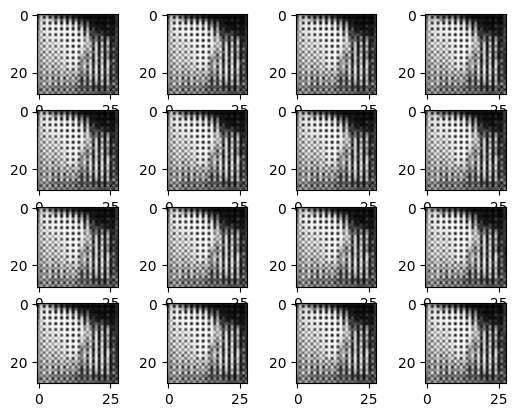

[Epoch: 2/80] D_loss: 0.306 G_loss: 1.372
Generated images for epoch: 2


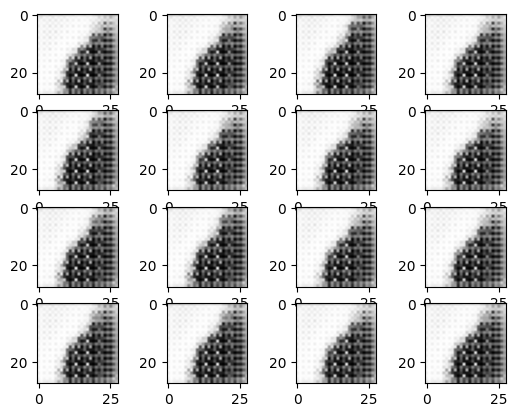

[Epoch: 3/80] D_loss: 0.175 G_loss: 1.838
Generated images for epoch: 3


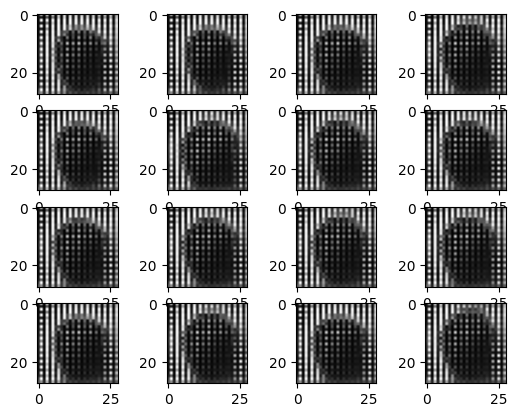

[Epoch: 4/80] D_loss: 0.126 G_loss: 2.162
Generated images for epoch: 4


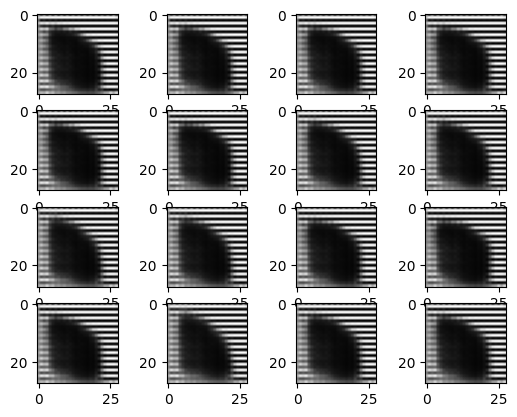

[Epoch: 5/80] D_loss: 0.096 G_loss: 2.407
Generated images for epoch: 5


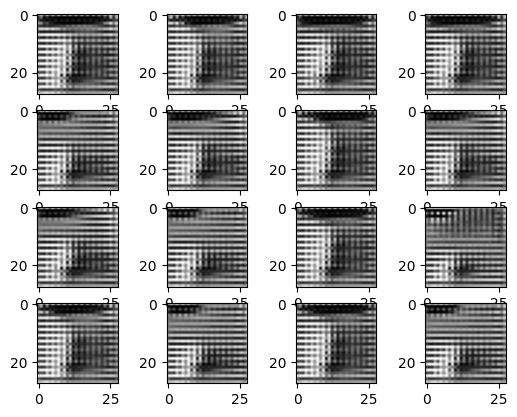

[Epoch: 6/80] D_loss: 0.068 G_loss: 2.697
Generated images for epoch: 6


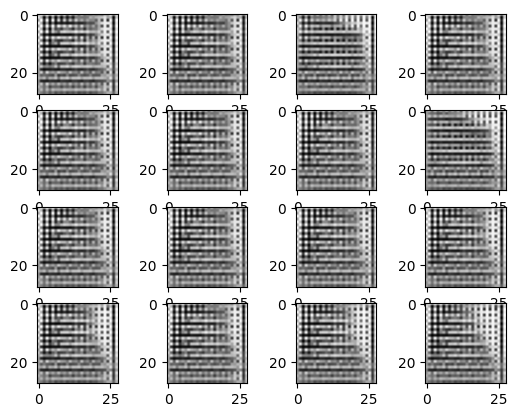

[Epoch: 7/80] D_loss: 0.059 G_loss: 2.870
Generated images for epoch: 7


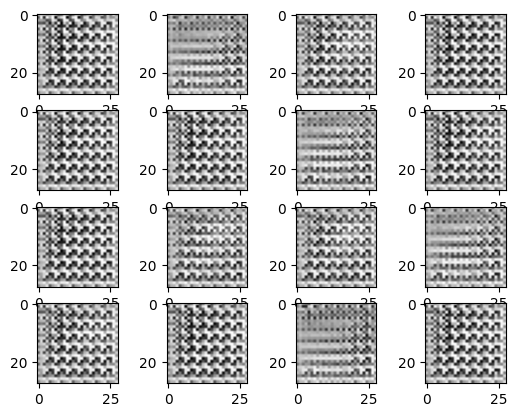

[Epoch: 8/80] D_loss: 0.050 G_loss: 3.019
Generated images for epoch: 8


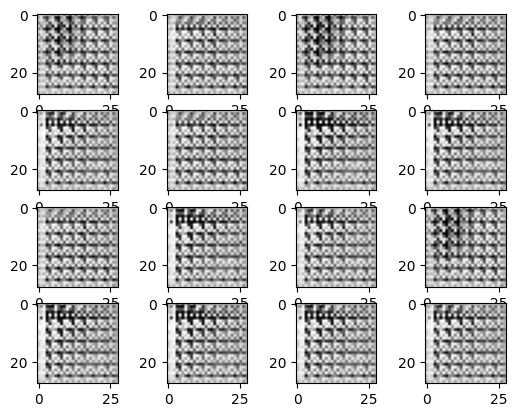

[Epoch: 9/80] D_loss: 0.048 G_loss: 3.050
Generated images for epoch: 9


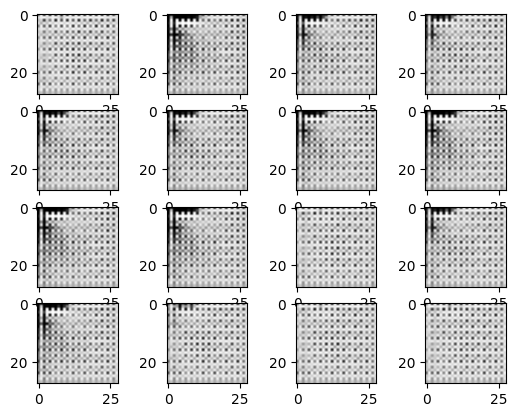

[Epoch: 10/80] D_loss: 0.042 G_loss: 3.174
Generated images for epoch: 10


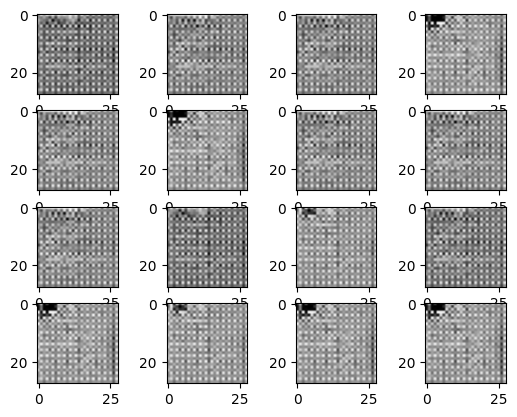

[Epoch: 11/80] D_loss: 0.042 G_loss: 3.127
Generated images for epoch: 11


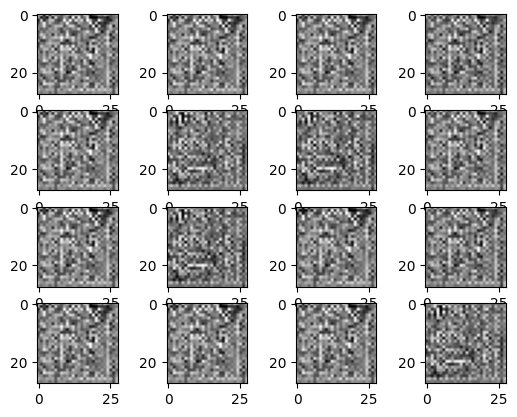

[Epoch: 12/80] D_loss: 0.039 G_loss: 3.253
Generated images for epoch: 12


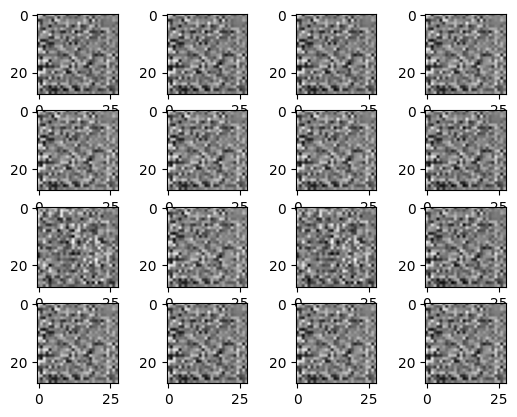

[Epoch: 13/80] D_loss: 0.036 G_loss: 3.335
Generated images for epoch: 13


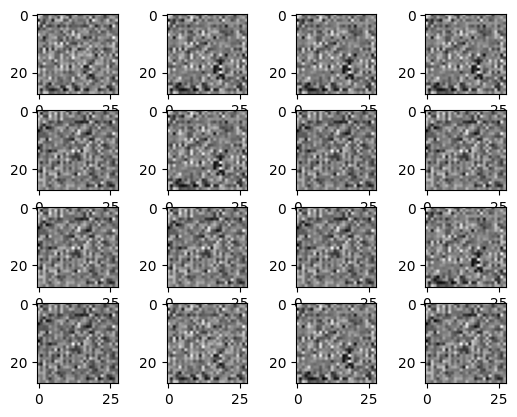

[Epoch: 14/80] D_loss: 0.033 G_loss: 3.408
Generated images for epoch: 14


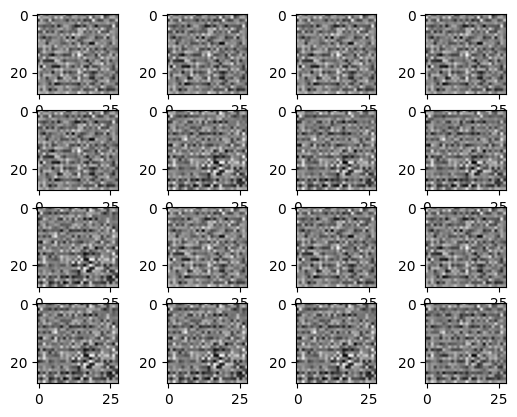

[Epoch: 15/80] D_loss: 0.031 G_loss: 3.474
Generated images for epoch: 15


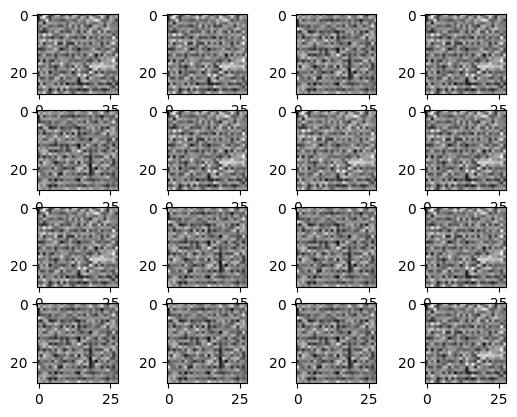

[Epoch: 16/80] D_loss: 0.030 G_loss: 3.505
Generated images for epoch: 16


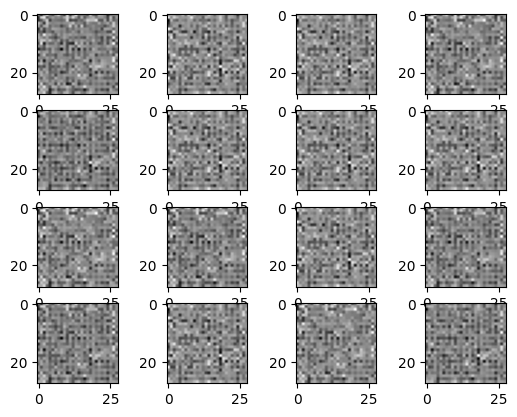

[Epoch: 17/80] D_loss: 0.029 G_loss: 3.557
Generated images for epoch: 17


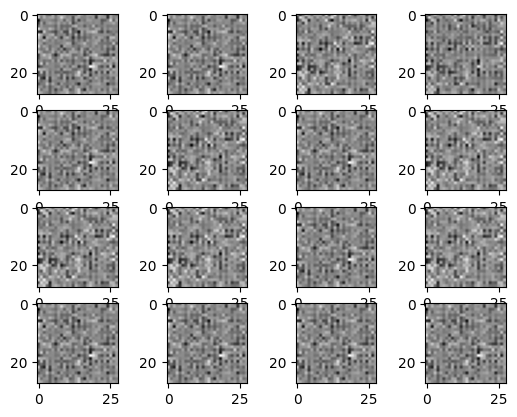

[Epoch: 18/80] D_loss: 0.027 G_loss: 3.610
Generated images for epoch: 18


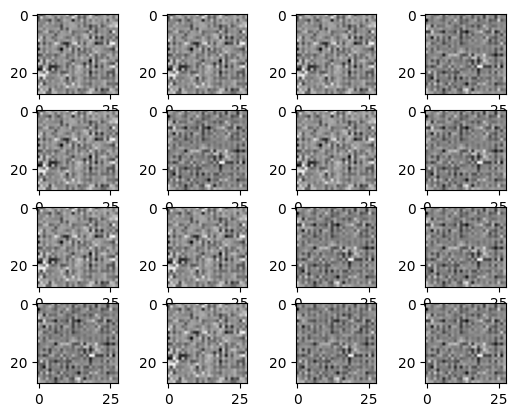

[Epoch: 19/80] D_loss: 0.026 G_loss: 3.640
Generated images for epoch: 19


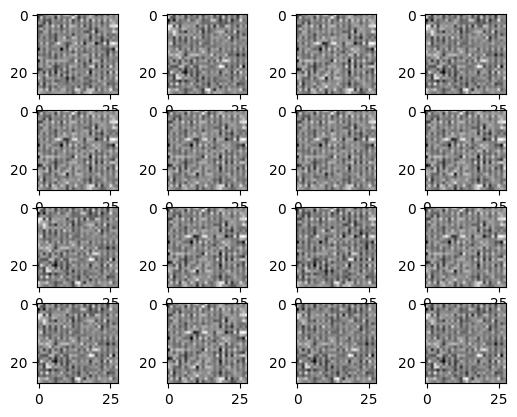

[Epoch: 20/80] D_loss: 0.026 G_loss: 3.657
Generated images for epoch: 20


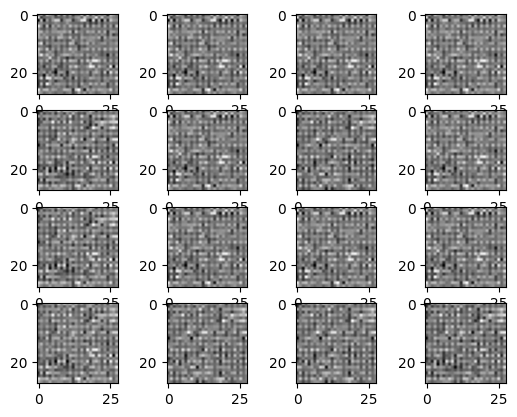

[Epoch: 21/80] D_loss: 0.026 G_loss: 3.661
Generated images for epoch: 21


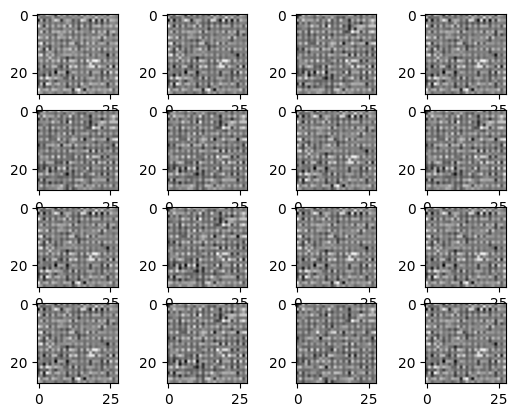

[Epoch: 22/80] D_loss: 0.025 G_loss: 3.700
Generated images for epoch: 22


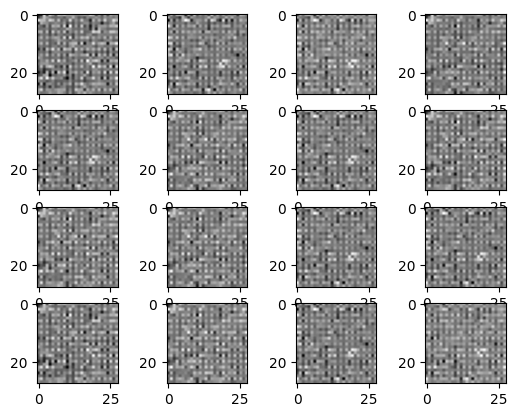

[Epoch: 23/80] D_loss: 0.024 G_loss: 3.738
Generated images for epoch: 23


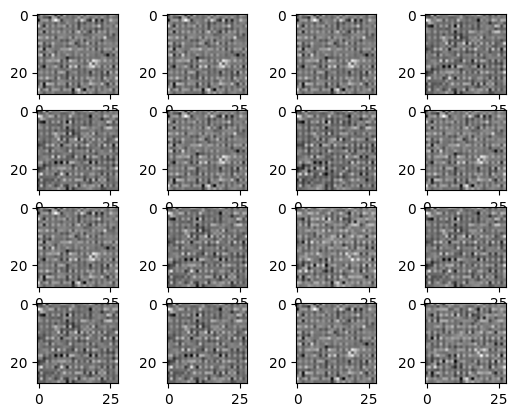

[Epoch: 24/80] D_loss: 0.024 G_loss: 3.750
Generated images for epoch: 24


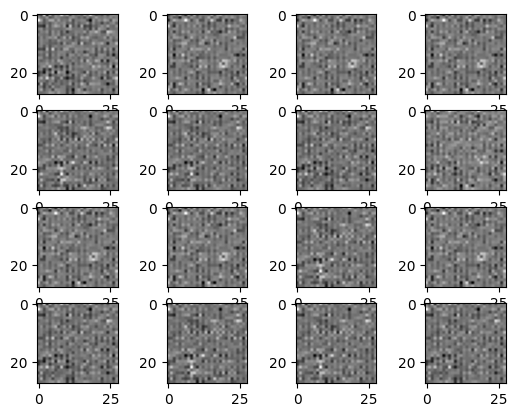

[Epoch: 25/80] D_loss: 0.024 G_loss: 3.760
Generated images for epoch: 25


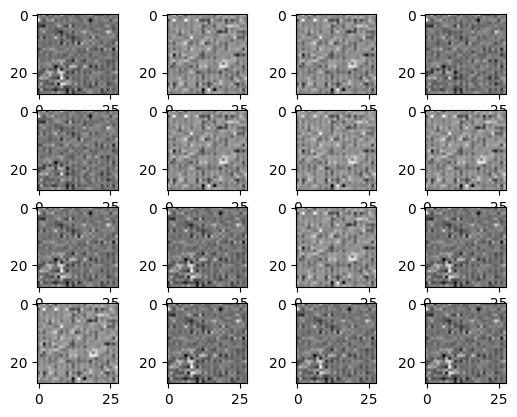

[Epoch: 26/80] D_loss: 0.023 G_loss: 3.794
Generated images for epoch: 26


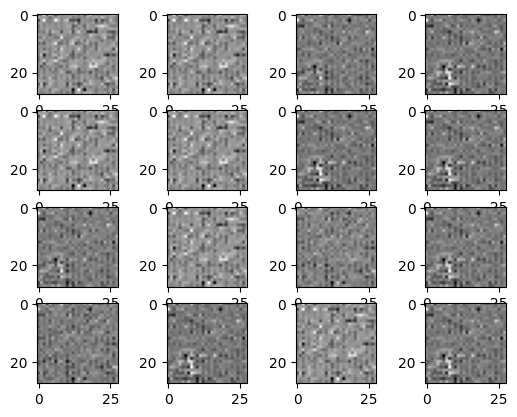

[Epoch: 27/80] D_loss: 0.022 G_loss: 3.814
Generated images for epoch: 27


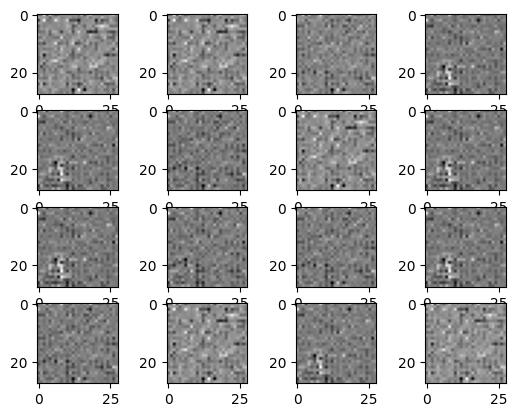

[Epoch: 28/80] D_loss: 0.022 G_loss: 3.821
Generated images for epoch: 28


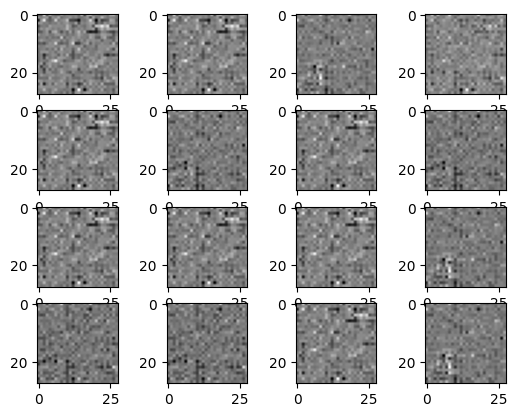

[Epoch: 29/80] D_loss: 0.022 G_loss: 3.818
Generated images for epoch: 29


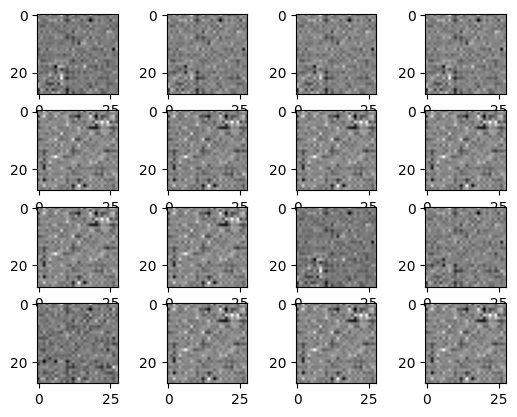

[Epoch: 30/80] D_loss: 0.022 G_loss: 3.832
Generated images for epoch: 30


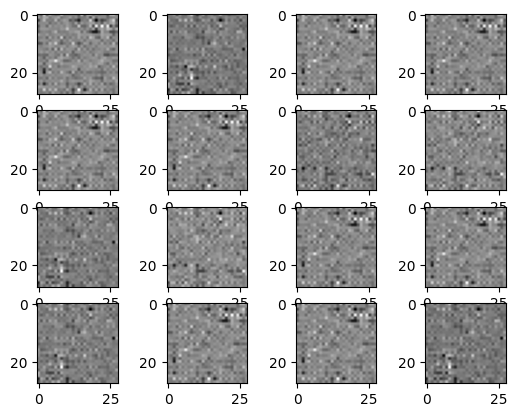

[Epoch: 31/80] D_loss: 0.022 G_loss: 3.830
Generated images for epoch: 31


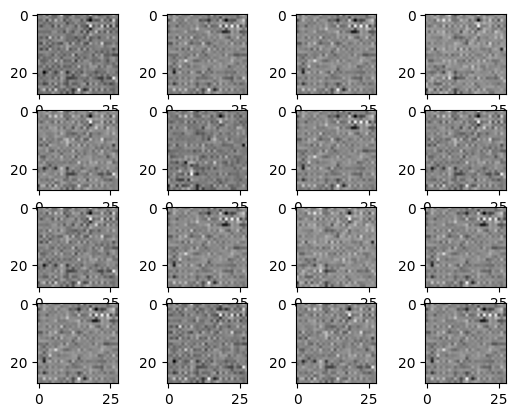

[Epoch: 32/80] D_loss: 0.022 G_loss: 3.827
Generated images for epoch: 32


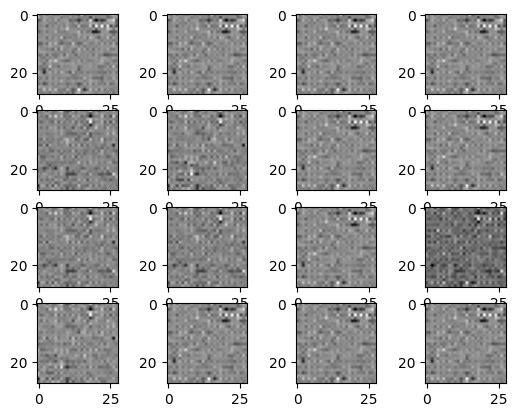

[Epoch: 33/80] D_loss: 0.022 G_loss: 3.834
Generated images for epoch: 33


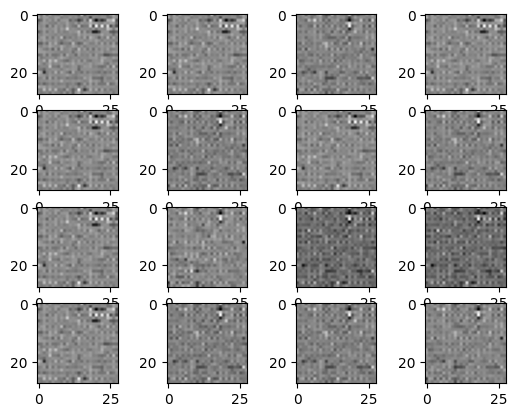

[Epoch: 34/80] D_loss: 0.022 G_loss: 3.839
Generated images for epoch: 34


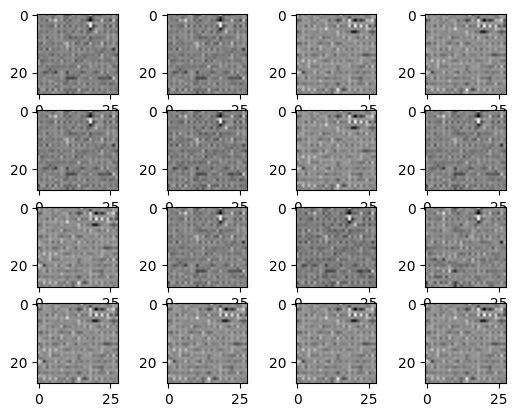

[Epoch: 35/80] D_loss: 0.022 G_loss: 3.842
Generated images for epoch: 35


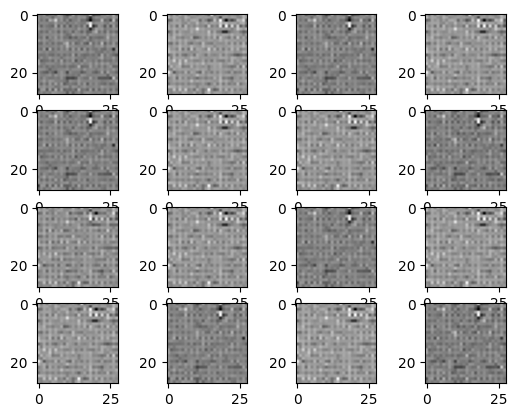

[Epoch: 36/80] D_loss: 0.022 G_loss: 3.833
Generated images for epoch: 36


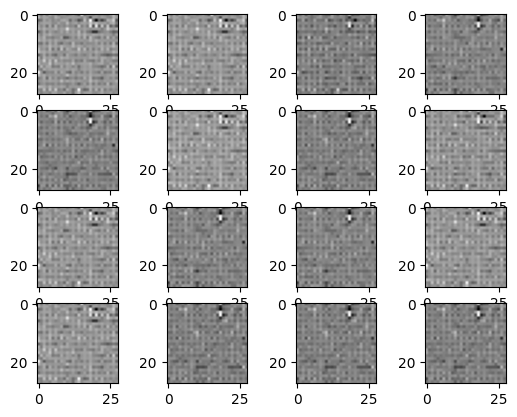

[Epoch: 37/80] D_loss: 0.022 G_loss: 3.825
Generated images for epoch: 37


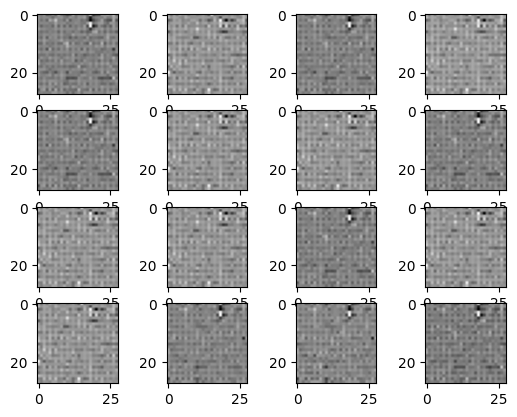

[Epoch: 38/80] D_loss: 0.022 G_loss: 3.813
Generated images for epoch: 38


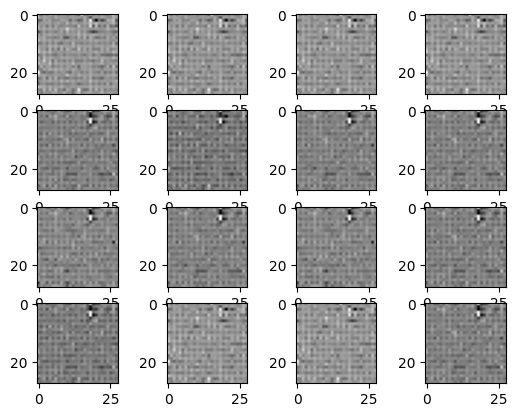

[Epoch: 39/80] D_loss: 0.022 G_loss: 3.812
Generated images for epoch: 39


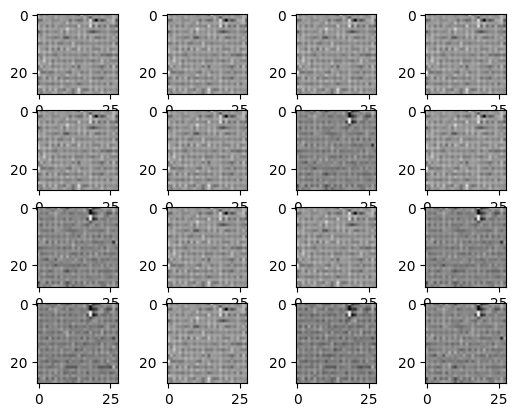

[Epoch: 40/80] D_loss: 0.022 G_loss: 3.812
Generated images for epoch: 40


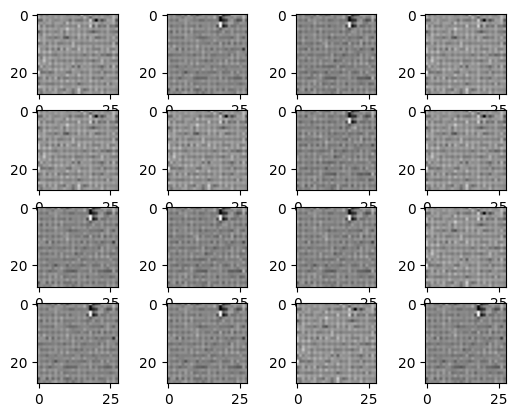

[Epoch: 41/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 41


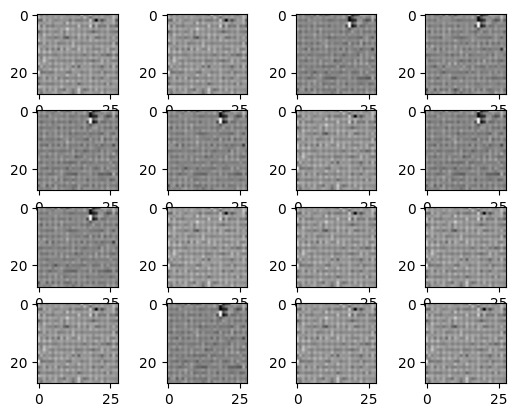

[Epoch: 42/80] D_loss: 0.022 G_loss: 3.782
Generated images for epoch: 42


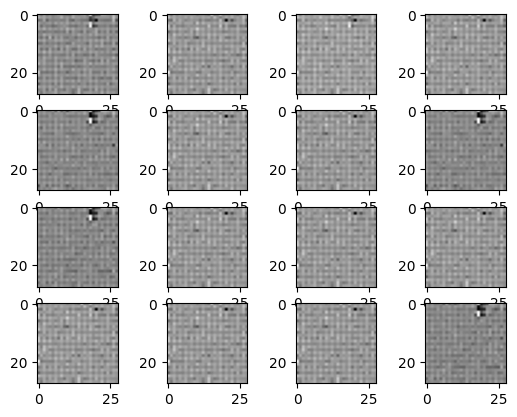

[Epoch: 43/80] D_loss: 0.023 G_loss: 3.753
Generated images for epoch: 43


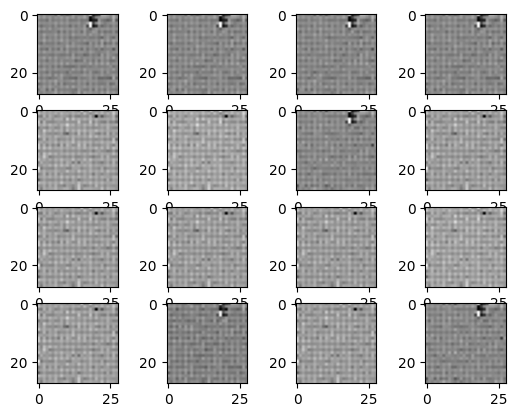

[Epoch: 44/80] D_loss: 0.023 G_loss: 3.729
Generated images for epoch: 44


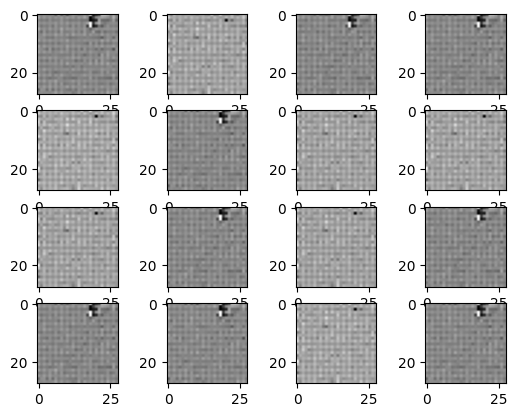

[Epoch: 45/80] D_loss: 0.023 G_loss: 3.715
Generated images for epoch: 45


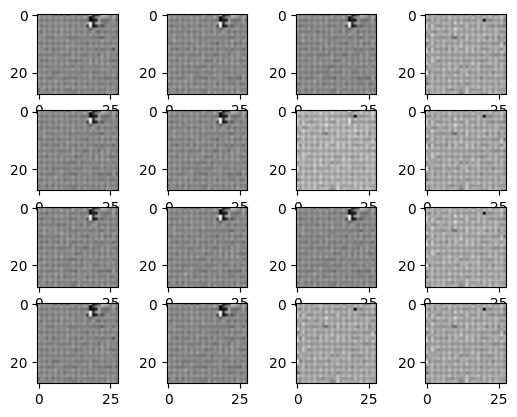

[Epoch: 46/80] D_loss: 0.023 G_loss: 3.715
Generated images for epoch: 46


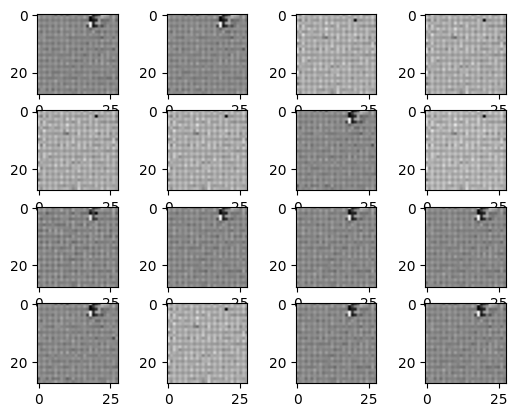

[Epoch: 47/80] D_loss: 0.023 G_loss: 3.719
Generated images for epoch: 47


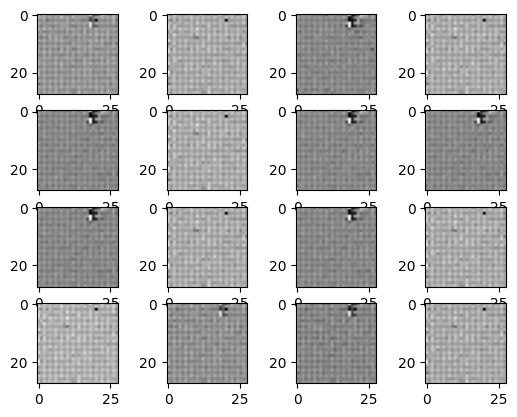

[Epoch: 48/80] D_loss: 0.023 G_loss: 3.728
Generated images for epoch: 48


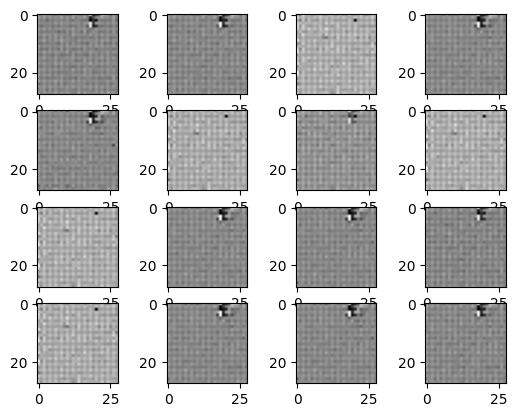

[Epoch: 49/80] D_loss: 0.023 G_loss: 3.739
Generated images for epoch: 49


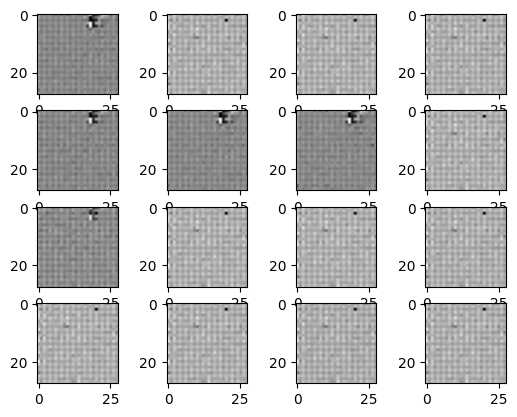

[Epoch: 50/80] D_loss: 0.023 G_loss: 3.746
Generated images for epoch: 50


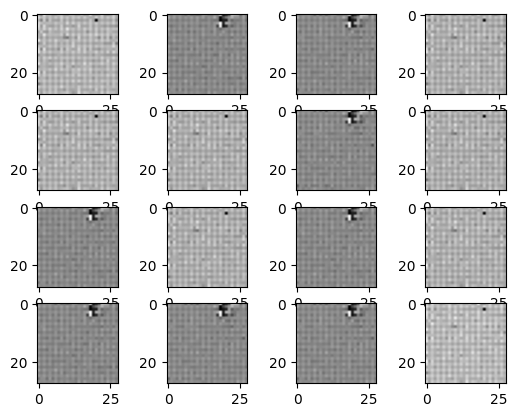

[Epoch: 51/80] D_loss: 0.022 G_loss: 3.756
Generated images for epoch: 51


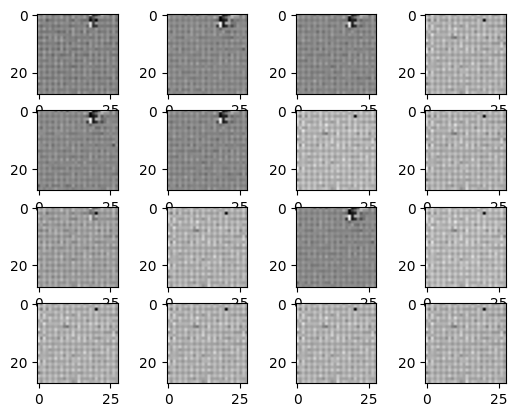

[Epoch: 52/80] D_loss: 0.022 G_loss: 3.759
Generated images for epoch: 52


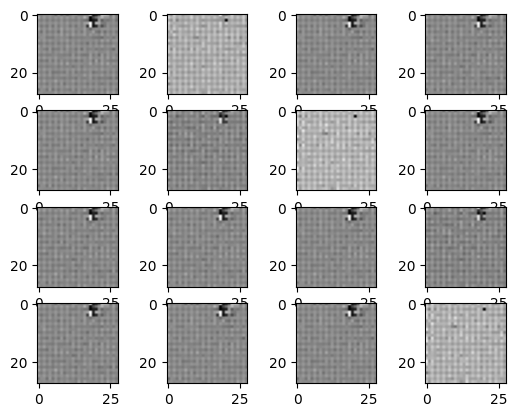

[Epoch: 53/80] D_loss: 0.022 G_loss: 3.765
Generated images for epoch: 53


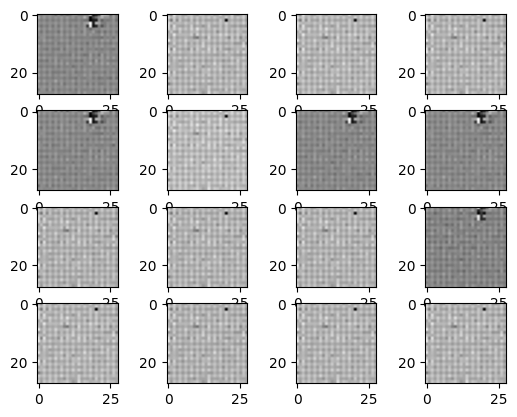

[Epoch: 54/80] D_loss: 0.023 G_loss: 3.769
Generated images for epoch: 54


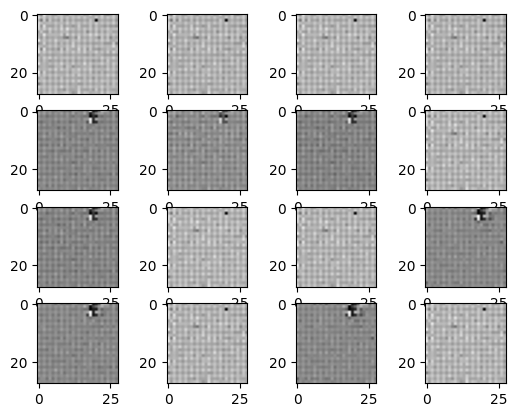

[Epoch: 55/80] D_loss: 0.022 G_loss: 3.776
Generated images for epoch: 55


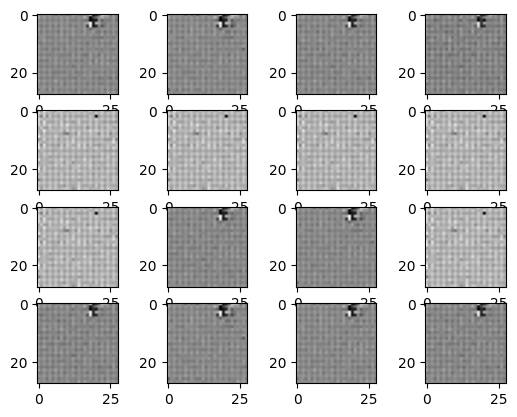

[Epoch: 56/80] D_loss: 0.022 G_loss: 3.778
Generated images for epoch: 56


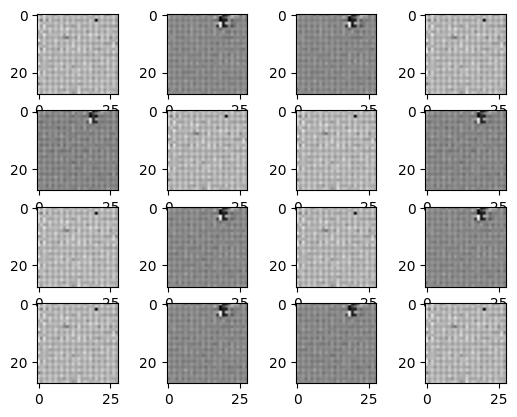

[Epoch: 57/80] D_loss: 0.022 G_loss: 3.781
Generated images for epoch: 57


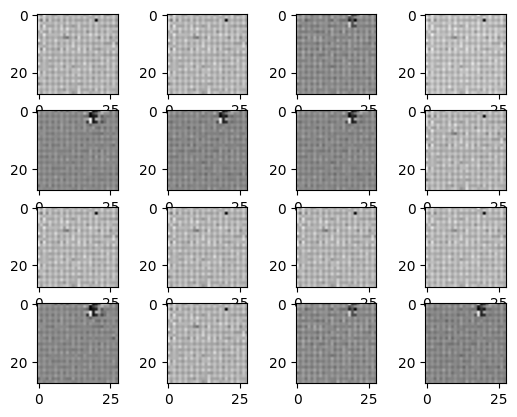

[Epoch: 58/80] D_loss: 0.022 G_loss: 3.782
Generated images for epoch: 58


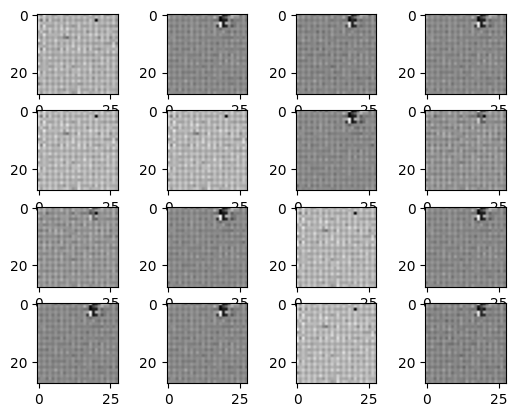

[Epoch: 59/80] D_loss: 0.022 G_loss: 3.785
Generated images for epoch: 59


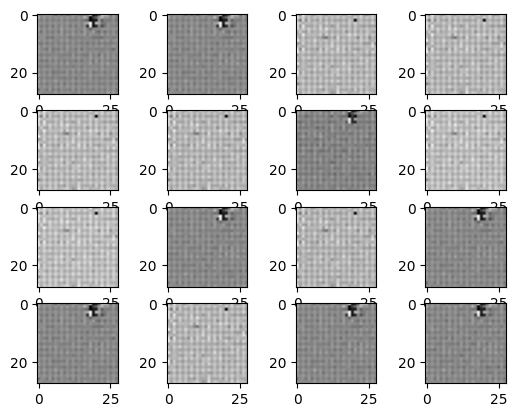

[Epoch: 60/80] D_loss: 0.022 G_loss: 3.791
Generated images for epoch: 60


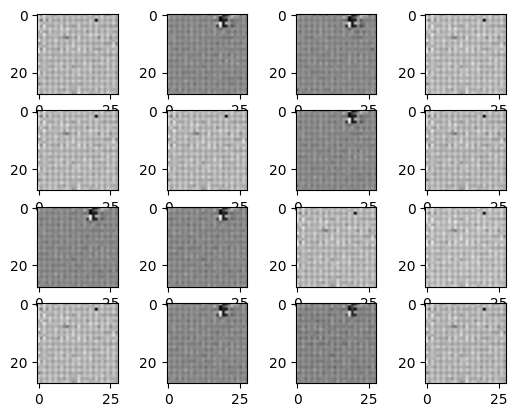

[Epoch: 61/80] D_loss: 0.022 G_loss: 3.791
Generated images for epoch: 61


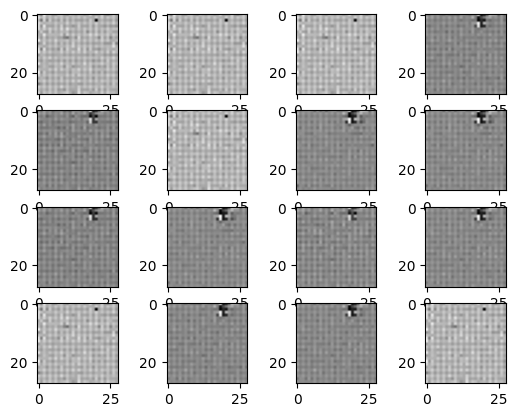

[Epoch: 62/80] D_loss: 0.022 G_loss: 3.793
Generated images for epoch: 62


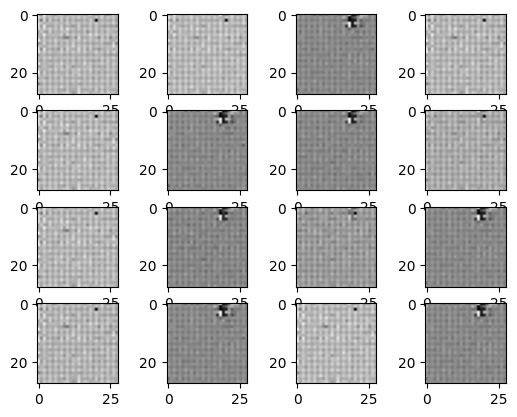

[Epoch: 63/80] D_loss: 0.022 G_loss: 3.792
Generated images for epoch: 63


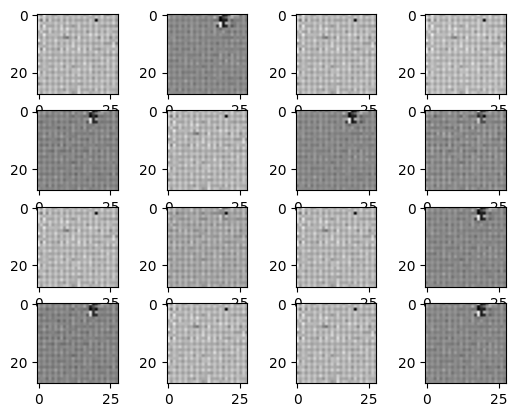

[Epoch: 64/80] D_loss: 0.022 G_loss: 3.794
Generated images for epoch: 64


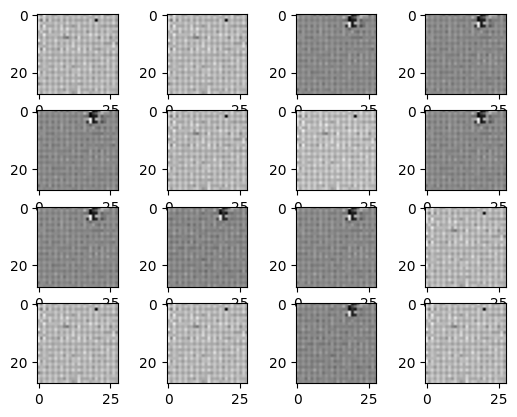

[Epoch: 65/80] D_loss: 0.022 G_loss: 3.794
Generated images for epoch: 65


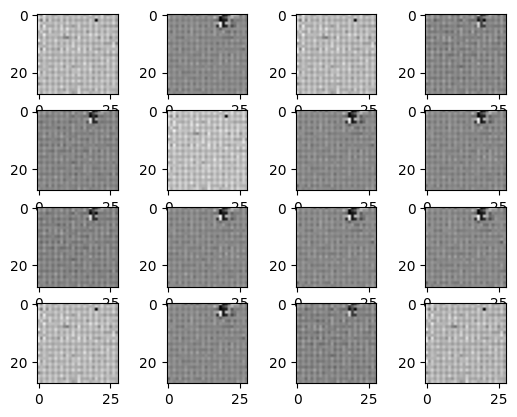

[Epoch: 66/80] D_loss: 0.022 G_loss: 3.796
Generated images for epoch: 66


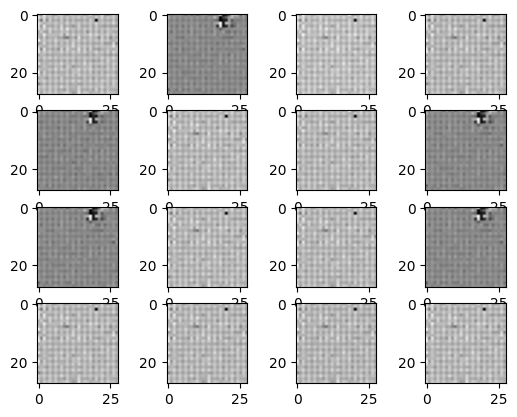

[Epoch: 67/80] D_loss: 0.022 G_loss: 3.797
Generated images for epoch: 67


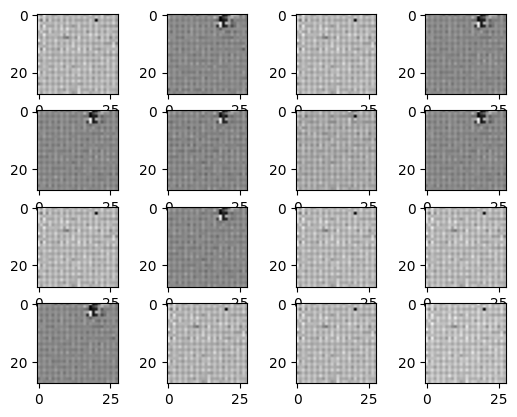

[Epoch: 68/80] D_loss: 0.022 G_loss: 3.796
Generated images for epoch: 68


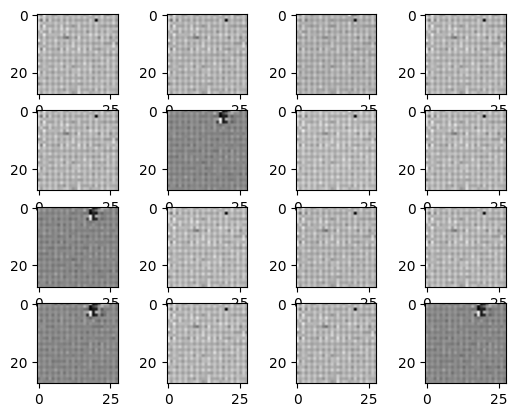

[Epoch: 69/80] D_loss: 0.022 G_loss: 3.796
Generated images for epoch: 69


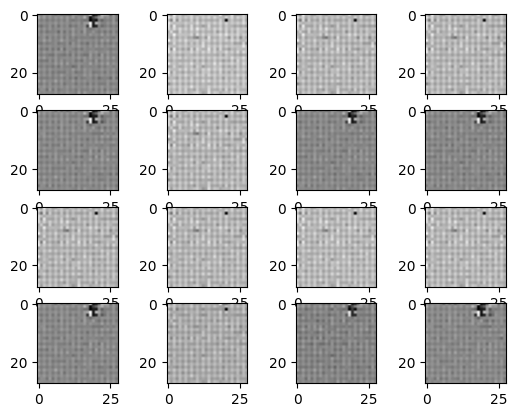

[Epoch: 70/80] D_loss: 0.022 G_loss: 3.799
Generated images for epoch: 70


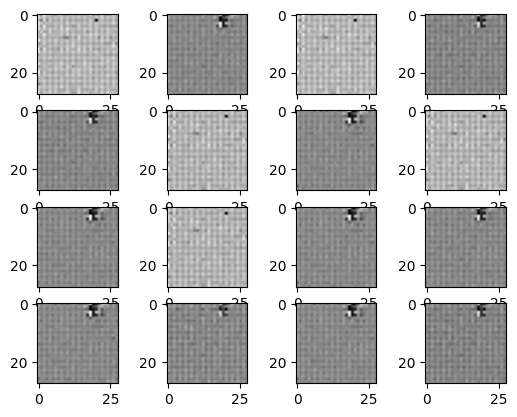

[Epoch: 71/80] D_loss: 0.022 G_loss: 3.798
Generated images for epoch: 71


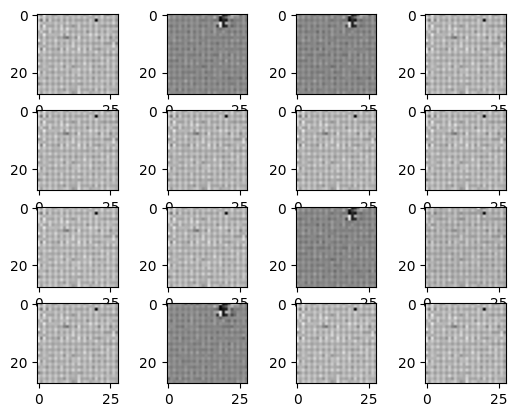

[Epoch: 72/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 72


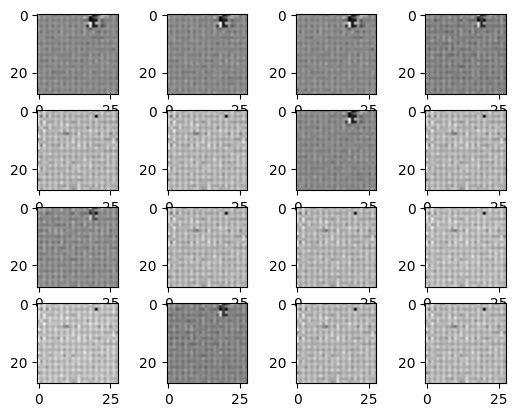

[Epoch: 73/80] D_loss: 0.022 G_loss: 3.797
Generated images for epoch: 73


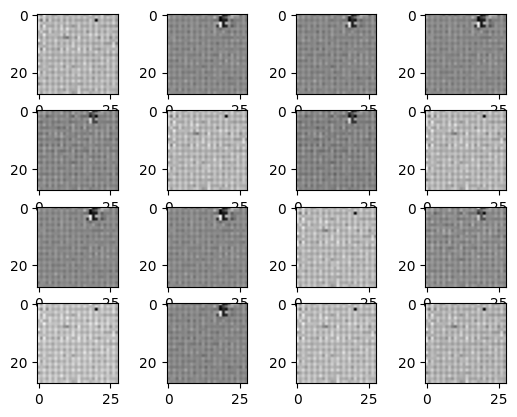

[Epoch: 74/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 74


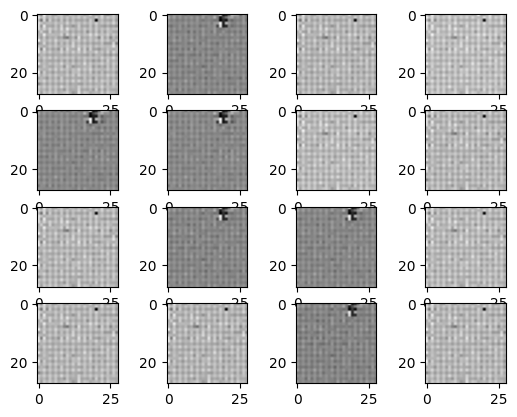

[Epoch: 75/80] D_loss: 0.022 G_loss: 3.802
Generated images for epoch: 75


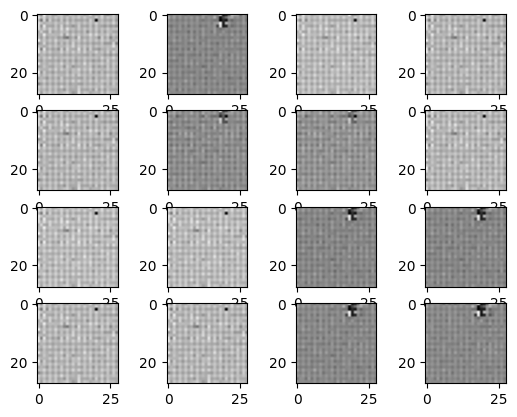

[Epoch: 76/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 76


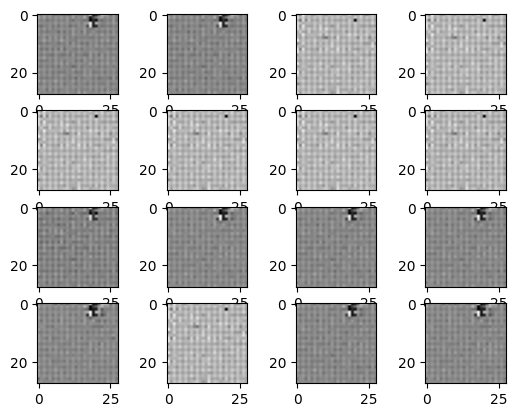

[Epoch: 77/80] D_loss: 0.022 G_loss: 3.803
Generated images for epoch: 77


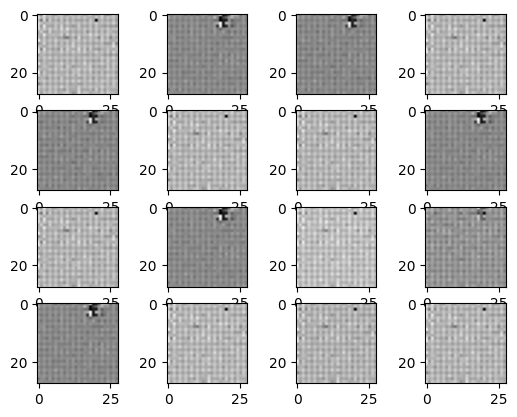

[Epoch: 78/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 78


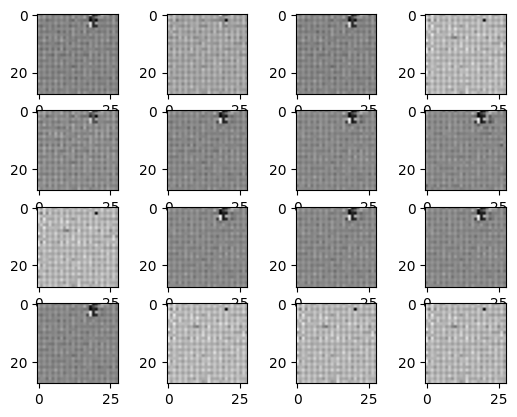

[Epoch: 79/80] D_loss: 0.022 G_loss: 3.800
Generated images for epoch: 79


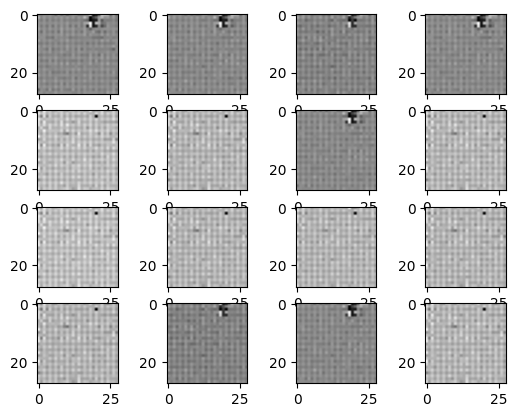

[Epoch: 80/80] D_loss: 0.022 G_loss: 3.803
Generated images for epoch: 80


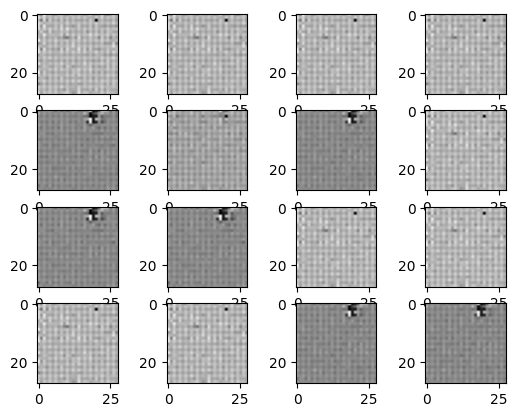

Model saved.
Training Finished.
Cost Time: 6504.036476135254s


In [ ]:
def show_images(images, epoch):
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    plt.figure()
    for index, image in enumerate(images):
        plt.subplot(sqrtn, sqrtn, index+1)
        plt.imshow(image.reshape(28, 28), cmap='gray')
    plt.savefig("Generator_epoch_{}.png".format(epoch))

# Train
adversarial_loss = torch.nn.CrossEntropyLoss().to(device)
# adversarial_loss = torch.nn.BCELoss().to(device)

G.train()
D.train()
loss_g, loss_d = [],[]
start_time = time.time()
for epoch in range(epochs):
    epoch += 1
    total_loss_g,total_loss_d=0,0
    count_d=0

    for i_iter, (images, label) in enumerate(train_loader):
        i_iter += 1

        # -----------------
        #  Train Generator
        # -----------------
        g_optimizer.zero_grad()
        # Sample noise as generator input
        noise = torch.randn(images.shape[0], latent_dim, 1, 1)
        noise = noise.to(device)

        # 因為Generator希望生成出來的圖片跟真的一樣，所以fake_label標註用 1
        fake_label = torch.ones(images.shape[0], dtype=torch.long).to(device) # notice: label = 1

        # Generate a batch of images
        fake_inputs = G(noise)
        fake_outputs = D(fake_inputs)

        # Loss measures generator's ability to fool the discriminator
        loss_g_value = adversarial_loss(fake_outputs, fake_label)
        loss_g_value.backward()
        g_optimizer.step()
        total_loss_g+=loss_g_value
        loss_g.append(loss_g_value)

        # ---------------------
        #  Train Discriminator
        # ---------------------
        # Zero the parameter gradients
        d_optimizer.zero_grad()
        # Measure discriminator's ability to classify real from generated samples
        # 因為Discriminator希望判斷哪些是真的那些是生成的，所以real_label資料標註用 1，fake_label標註用0。
        real_inputs = images.to(device)
        real_label = torch.ones(real_inputs.shape[0], dtype=torch.long).to(device)
        fake_label = torch.zeros(fake_inputs.shape[0], dtype=torch.long).to(device)
#       learning by Discriminator
        real_loss = adversarial_loss(D(real_inputs),real_label)
        fake_loss = adversarial_loss(D(fake_inputs.detach()),fake_label)
        loss_d_value = (real_loss + fake_loss) / 2
        loss_d_value.backward()
        d_optimizer.step()
        total_loss_d+=loss_d_value
        loss_d.append(loss_d_value)

    total_loss_g/=len(train_loader)
    total_loss_d/=len(train_loader)
    g_scheduler.step()
    d_scheduler.step()
    print('[Epoch: {}/{}] D_loss: {:.3f} G_loss: {:.3f}'.format(epoch, epochs, total_loss_d.item(), total_loss_g.item()))
    if epoch % 1 == 0:
        print('Generated images for epoch: {}'.format(epoch))
        imgs_numpy = fake_inputs.data.cpu().numpy()
        show_images(imgs_numpy[:16],epoch)
        plt.show()

torch.save(G, 'DCGAN_Generator.pth')
torch.save(D, 'DCGAN_Discriminator.pth')
print('Model saved.')

print('Training Finished.')
print('Cost Time: {}s'.format(time.time()-start_time))

In [ ]:
plt.plot(loss_g)
plt.plot(loss_d,'r')
plt.legend(['G','D'])
plt.show()

In [ ]:
import torch
def show_images(images):
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    plt.figure()
    for index, image in enumerate(images):
        plt.subplot(sqrtn, sqrtn, index+1)
        plt.imshow(image.reshape(28, 28))
    plt.show()

flag_gpu = 1
device = 'cuda:0' if (torch.cuda.is_available() & flag_gpu) else 'cpu'
print(device)

G = torch.load('DCGAN_Generator.pth', map_location=device)

latent_dim = 10

## Exp:1
noise = torch.randn(20, latent_dim, 1, 1)
noise = noise.to(device)

# Generate a batch of images
fake_inputs = G(noise)

imgs_numpy = fake_inputs.data.cpu().numpy()
show_images(imgs_numpy[:16])

## Exp:2
noise = torch.randn(20, latent_dim, 1, 1) *-10000
noise = noise.to(device)

# Generate a batch of images
fake_inputs = G(noise)

imgs_numpy = fake_inputs.data.cpu().numpy()
show_images(imgs_numpy[:16])


## Exp:3
noise = torch.randn(20, latent_dim, 1, 1) *50000
noise = noise.to(device)

# Generate a batch of images
fake_inputs = G(noise)

imgs_numpy = fake_inputs.data.cpu().numpy()
show_images(imgs_numpy[:16])